In [ ]:
#!python -m spacy download el_core_news_sm

Εισάγω τις βιβλιοθήκες

In [102]:
import pandas as pd
import matplotlib.pyplot as plt
import spacy
from wordcloud import WordCloud
import seaborn as sns


Συνδέομαι με το gdrive

In [103]:
# σύνδεση με το gdrive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Φτιάχνω την nlp για να την έχω έτοιμη για μετά

In [104]:
nlp = spacy.load('el_core_news_sm')

Φέρνω το csv του ernews.gr

In [105]:
ertnews_articles_df=pd.read_csv('/content/gdrive/MyDrive/2023/teaching python/Lesson 9/datasets_MAY23_6_sites/ertnews.gr-MAY23.csv')
ertnews_articles_df

,site,url,date,section,title,author,text
0,ertnews.gr,https://www.ertnews.gr/eidiseis/o-santiago-pen...,2023-05-01,Αμερική,"Ο Σαντιάγο Πένια, νέος πρόεδρος της Παραγουάης",Συντακτική ομάδα ertnews.gr,"Ο Σαντιάγο Πένια, ο υποψήφιος του κυβερνώντος ..."
1,ertnews.gr,https://www.ertnews.gr/roi-idiseon/synantisi-t...,2023-05-01,ΔΙΕΘΝΗ,Συνάντηση του αρχηγού του ουκρανικού στρατού μ...,Συντακτική ομάδα ertnews.gr,Εν μέσω προετοιμασιών για την πολυσυζητημένη ο...
2,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/rosia-...,2023-05-01,ΔΙΕΘΝΗ,Ρωσία: Απεβίωσε σε ηλικία 85 ετών ο διάσημος σ...,Συντακτική Ομάδα ertnews.gr,Απεβίωσε σε ηλικία 85 ετών ο διάσημος Ρώσος σχ...
3,ertnews.gr,https://www.ertnews.gr/eidiseis/katastrafike-k...,2023-05-01,ΕΛΛΑΔΑ,Καταστράφηκε καφετέρια στην Αρτέμιδα απο πυρκαγιά,Συντακτική ομάδα ertnews.gr,Ολοσχερώς καταστράφηκε καφετέρια στην Αρτέμιδα...
4,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/tourki...,2023-05-01,ΔΙΕΘΝΗ,Τουρκία: Ο «φερόμενος ηγέτης» του Ισλαμικού Κρ...,Συντακτική Ομάδα ertnews.gr,Ο «φερόμενος ηγέτης» της τζιχαντιστικής οργάνω...
...,...,...,...,...,...,...,...
4875,ertnews.gr,https://www.ertnews.gr/eidiseis/epistimi/ereyn...,2023-05-31,ΕΠΙΣΤΗΜΗ,Έρευνα: Πώς επηρεάζει τον εγκέφαλο η καρδιακή ...,Εύη Τσιριγωτάκη,Η αποκατάσταση μετά από καρδιακή προσβολή επικ...
4876,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/dania-...,2023-05-31,ΔΙΕΘΝΗ,Δανία: Η πρωθυπουργός εκφώνησε ομιλία από το C...,Συντακτική ομάδα ertnews.gr,Η πρωθυπουργός της Δανίας Μέτε Φρεντέρικσεν εκ...
4877,ertnews.gr,https://www.ertnews.gr/roi-idiseon/synantisi-p...,2023-05-31,Πολιτική,Συνάντηση ΠτΔ Κ. Σακελλαροπούλου με τον Αρχιεπ...,Συντακτική Ομάδα ertnews.gr,Η Πρόεδρος της Δημοκρατίας Κατερίνα Σακελλαροπ...
4878,ertnews.gr,https://www.ertnews.gr/eidiseis/ellada/politik...,2023-05-31,Πολιτική,ΥΠΕΞ: Βαθιά θλίψη για την απώλεια του Θεόδωρου...,Συντακτική ομάδα ertnews.gr,Σε ανακοίνωση προέβη το Υπουργείο Εξωτερικών γ...


Κοιτάω για missing values

In [106]:
ertnews_articles_df.isna().sum()

site       0
url        0
date       0
section    0
title      0
author     0
text       0
dtype: int64

Αν υπάρχουν missing values, πετάω τα rows με missing values

In [107]:
ertnews_articles_df = ertnews_articles_df.dropna(axis=0)
ertnews_articles_df.shape

(4880, 7)

Κοιτάω για duplicates

In [108]:
ertnews_articles_df[ertnews_articles_df.duplicated(keep=False)]

,site,url,date,section,title,author,text


Αν υπάρχουν duplicates τα πετάω

In [109]:
ertnews_articles_df.drop_duplicates(inplace=True)
ertnews_articles_df.shape

(4880, 7)

Κοιτάω το format του date

In [110]:
ertnews_articles_df.loc[0, 'date']

'2023-05-01'

Μετατρέπω το date σε datetime

In [111]:
ertnews_articles_df['date'] = pd.to_datetime(ertnews_articles_df['date'], format='%Y-%m-%d %H:%M')
ertnews_articles_df.dtypes

site               object
url                object
date       datetime64[ns]
section            object
title              object
author             object
text               object
dtype: object

Αν θέλω συγκεκριμένες ημερομηνίες

In [112]:
ertnews_articles_df['date'].min(), ertnews_articles_df['date'].max()

(Timestamp('2023-05-01 00:00:00'), Timestamp('2023-05-31 00:00:00'))

π.χ. τις 10 πρώτες μέρες του Μαίου

In [113]:
# το φιλτράρισμα για τις πρώτες 10 μέρες είναι
ertnews_articles_df[pd.DatetimeIndex(ertnews_articles_df['date']).day < 10].head()

,site,url,date,section,title,author,text
0,ertnews.gr,https://www.ertnews.gr/eidiseis/o-santiago-pen...,2023-05-01,Αμερική,"Ο Σαντιάγο Πένια, νέος πρόεδρος της Παραγουάης",Συντακτική ομάδα ertnews.gr,"Ο Σαντιάγο Πένια, ο υποψήφιος του κυβερνώντος ..."
1,ertnews.gr,https://www.ertnews.gr/roi-idiseon/synantisi-t...,2023-05-01,ΔΙΕΘΝΗ,Συνάντηση του αρχηγού του ουκρανικού στρατού μ...,Συντακτική ομάδα ertnews.gr,Εν μέσω προετοιμασιών για την πολυσυζητημένη ο...
2,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/rosia-...,2023-05-01,ΔΙΕΘΝΗ,Ρωσία: Απεβίωσε σε ηλικία 85 ετών ο διάσημος σ...,Συντακτική Ομάδα ertnews.gr,Απεβίωσε σε ηλικία 85 ετών ο διάσημος Ρώσος σχ...
3,ertnews.gr,https://www.ertnews.gr/eidiseis/katastrafike-k...,2023-05-01,ΕΛΛΑΔΑ,Καταστράφηκε καφετέρια στην Αρτέμιδα απο πυρκαγιά,Συντακτική ομάδα ertnews.gr,Ολοσχερώς καταστράφηκε καφετέρια στην Αρτέμιδα...
4,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/tourki...,2023-05-01,ΔΙΕΘΝΗ,Τουρκία: Ο «φερόμενος ηγέτης» του Ισλαμικού Κρ...,Συντακτική Ομάδα ertnews.gr,Ο «φερόμενος ηγέτης» της τζιχαντιστικής οργάνω...


Οπότε φτιάχνω ένα df με τα άρθρα μόνο των πρώτων 10 ημερών

In [114]:
ertnews_articles_10_df = ertnews_articles_df[pd.DatetimeIndex(ertnews_articles_df['date']).day < 10].copy()
ertnews_articles_10_df

,site,url,date,section,title,author,text
0,ertnews.gr,https://www.ertnews.gr/eidiseis/o-santiago-pen...,2023-05-01,Αμερική,"Ο Σαντιάγο Πένια, νέος πρόεδρος της Παραγουάης",Συντακτική ομάδα ertnews.gr,"Ο Σαντιάγο Πένια, ο υποψήφιος του κυβερνώντος ..."
1,ertnews.gr,https://www.ertnews.gr/roi-idiseon/synantisi-t...,2023-05-01,ΔΙΕΘΝΗ,Συνάντηση του αρχηγού του ουκρανικού στρατού μ...,Συντακτική ομάδα ertnews.gr,Εν μέσω προετοιμασιών για την πολυσυζητημένη ο...
2,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/rosia-...,2023-05-01,ΔΙΕΘΝΗ,Ρωσία: Απεβίωσε σε ηλικία 85 ετών ο διάσημος σ...,Συντακτική Ομάδα ertnews.gr,Απεβίωσε σε ηλικία 85 ετών ο διάσημος Ρώσος σχ...
3,ertnews.gr,https://www.ertnews.gr/eidiseis/katastrafike-k...,2023-05-01,ΕΛΛΑΔΑ,Καταστράφηκε καφετέρια στην Αρτέμιδα απο πυρκαγιά,Συντακτική ομάδα ertnews.gr,Ολοσχερώς καταστράφηκε καφετέρια στην Αρτέμιδα...
4,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/tourki...,2023-05-01,ΔΙΕΘΝΗ,Τουρκία: Ο «φερόμενος ηγέτης» του Ισλαμικού Κρ...,Συντακτική Ομάδα ertnews.gr,Ο «φερόμενος ηγέτης» της τζιχαντιστικής οργάνω...
...,...,...,...,...,...,...,...
1448,ertnews.gr,https://www.ertnews.gr/eidiseis/epistimi/evzoi...,2023-05-09,ΔΙΕΘΝΗ,Η φινλανδική δοκιμή ασθενοφόρου ψυχικής υγείας...,Ντάνιελ Στάνκοβιτς,"Κατά τη διάρκεια της εξάμηνης δοκιμής τους, τα..."
1449,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/mayrov...,2023-05-09,ΔΙΕΘΝΗ,Μαυροβούνιο: 200 ευρώ πρόστιμο για όσους περπα...,Συντακτική ομάδα ertnews.gr,Με νέα απόφαση που εγκρίθηκε στην τελευταία συ...
1450,ertnews.gr,https://www.ertnews.gr/eidiseis/epistimi/ena-t...,2023-05-09,ΕΠΙΣΤΗΜΗ,Ένα τυχαίο γεγονός πριν από 1 εκατομμύριο χρόν...,Εύη Τσιριγωτάκη,Ορισμένες περιοχές του DNA δεν επηρεάζονται απ...
1451,ertnews.gr,https://www.ertnews.gr/eidiseis/ellada/politik...,2023-05-09,Πολιτική,ΠΑΣΟΚ: Η PEGA αποκαλύπτει τις αντιδημοκρατικές...,Συντακτική ομάδα ertnews.gr,«Η εξεταστική επιτροπή PEGA του Ευρωπαϊκού Κοι...


Φτιάχνω μια νέα στήλη στην οποία βάζω συνενωμένο τον τίτλο με το text

Αυτό το κάνω γιατί μετέπειτα μπορεί να θέλω να αναλύσω είτε μόνο τους τίτλους είτε μόνο το text είτε όλο το κείμενο (τίτλος και κείμενο μαζί)

In [115]:
ertnews_articles_10_df['full-text'] = ertnews_articles_10_df['title'] + ' ' + ertnews_articles_10_df['text']

Θέλω να δω στα γρήγορα αν υπάρχουν θεματάκια με το κείμενο για να τα διορθώσω

Φτιάχνω ένα text ενώνοντας όλα τα full-texts

In [116]:
text = ertnews_articles_10_df['full-text'].str.cat(sep = ' ')
text[:200]

'Ο Σαντιάγο Πένια, νέος πρόεδρος της Παραγουάης Ο Σαντιάγο Πένια, ο υποψήφιος του κυβερνώντος κόμματος Colorado (δεξιά) –στην εξουσία επί σχεδόν οκτώ δεκαετίες στην Παραγουάη–, εξελέγη πρόεδρος της χώρ'

Φτιάχνω ένα wordcloud για να δω τι μου φέρνει

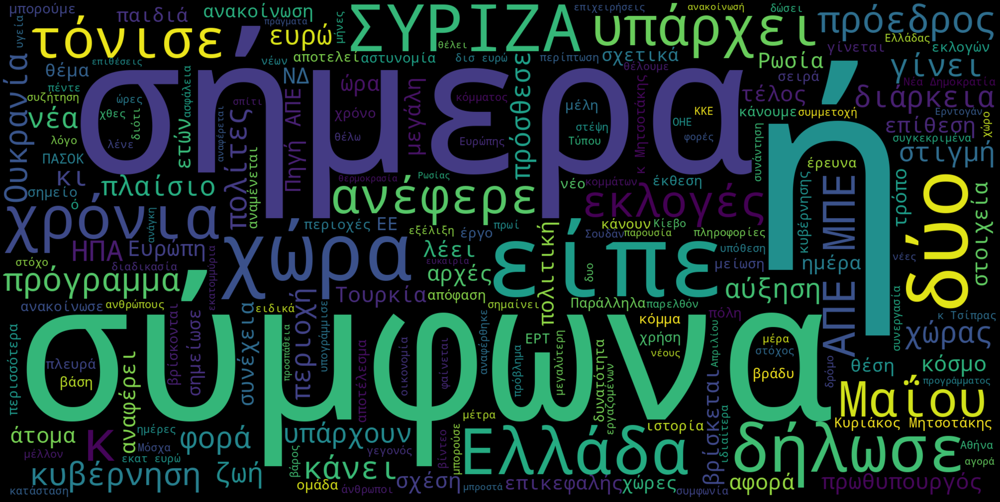

In [117]:
wordcloud1 = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud1, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Αν βλέπω ότι έχω ίδιες λέξεις άλλοτε με πεζά, άλλοτε με κεφαλαία, μπορώ να τα κάνω όλα πεζά

In [ ]:
# αν ποτέ θέλω να φτιάξω μια στήλη με πεζά και χωρίς τόνους
#ertnews_articles_10_df['full-text-lower-striped'] = ertnews_articles_10_df['full-text'].str.lower().str.replace('ά','α').str.replace('έ','ε').str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ώ','ω').str.replace('ύ','υ')

Ξανατρέχω το wordcloud αλλά αυτή τη φορά βάζω **μέσα στο generate()**, το text.lower()

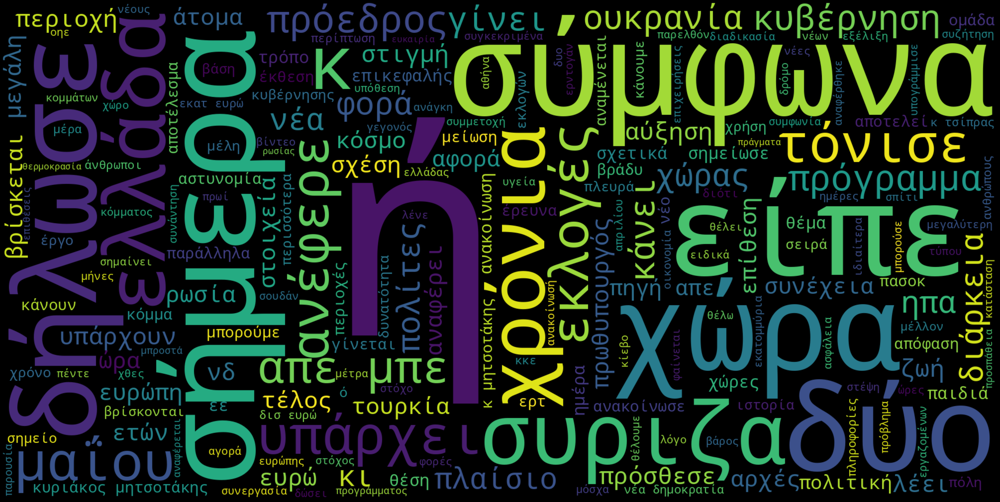

In [118]:
wordcloud1 = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text.lower()) # με το .lower() μετατρέπω το text σε πεζά
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud1, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Αν βλέπω να υπάρχει η ίδια λέξη σε διάφορους γραμματικούς τύπους (π.χ. πρόεδρος και πρόεδρο) κάνω lemmatization.

Ανάλογα με το πλήθος των χαρακτήρων στα κείμενα, αυτό μπορεί να πάρει αρκετή ώρα

In [119]:
# κάνω tokenize το κείμενο κάθε άρθρου, αφού πρώτα το μετατρέπω σε πεζά
ertnews_articles_10_df['lemmatized-full-text'] = ertnews_articles_10_df['full-text'].apply(lambda x: nlp(x.lower()))

In [120]:
# εφαρμόζω το lemmatization στο κείμενο κάθε άρθρου
ertnews_articles_10_df['lemmatized-full-text'] = ertnews_articles_10_df['lemmatized-full-text'].apply(lambda x: " ".join([token.lemma_ for token in x]))

Ξαναφτιάχνω το wordcloud. Mπορώ αντί να φτιάξω πρώτα το text (από τη στήλη lemmatized-full-text αυτή τη φορά) που θα δώσω μετά στο generate() του wordcloud, να φτιάξω το text της συνένωσης όλων των κειμένων της στήλης lemmatized-full-text μέσα στο generate() του wordcloud

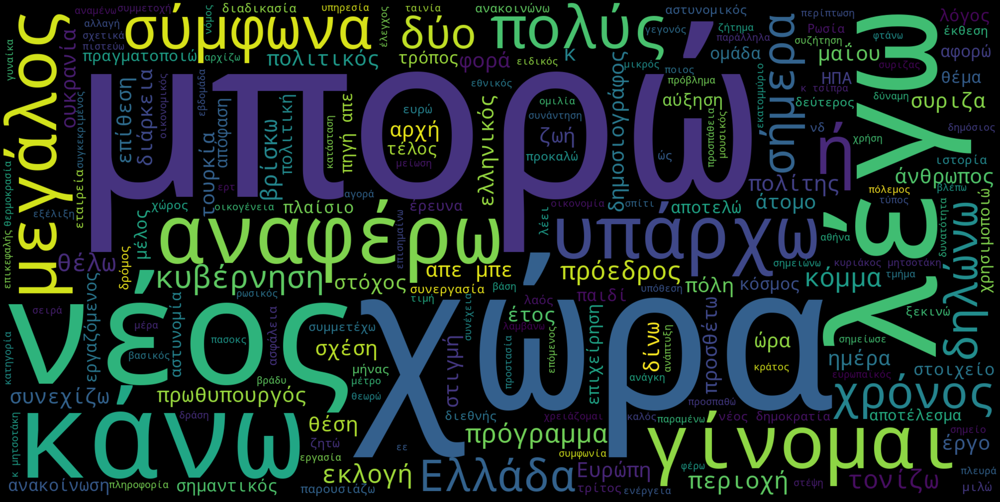

In [121]:
wordcloud1 = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(ertnews_articles_10_df['lemmatized-full-text'].str.cat(sep = ' ')) # κάνω εδώ τη συνένωση όλων των κειμένων της στήλης lemmatized-full-text
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud1, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Βλέπω ότι οι λέξεις έχουν "μεταφερθεί" στο πρώτο ενικό και στον ενεστώτα.

Το lemmatization (και ειδικά με το μικρό λεξικό της spacy) δεν είναι πάντα το καλύτερο. Ανάλογα με τις λέξεις που περιέχουν τα κείμενα άλλες φορές το wordcloud θα είναι καλύτερο με lemmatization και άλλες χωρίς. Πειραματίζομαι και αποφασίζω τι μου κάνει περισσότερο.

Για παράδειγμα, στα πρώτα wordclouds υπήρχε η λέξη "είπε" που εφόσον μιλάμε για δημοσιογραφικά κείμενα σημαίνει ότι στα άρθρα υπάρχει συχνά αναφορά στα λεγόμενα κάποιου. Μετά το lemmatization, η λέξη έγινε "λέγω", η οποία δεν αποδίδει σωστά το περιεχόμενο και το πνεύμα των άρθρων.

Από την άλλη, στα πρώτα wordclouds, η λέξη "σύμφωνα" εμφανιζόταν μεγάλη (δηλαδή φαινόταν να χρησιμοποιείται αρκετά συχνά. Στο wordcloud με το lemmatized text εμφανίζεται πολύ μικρότερη. Αυτό συμβαίνει επειδή μετά τη γραμματική μετατροπή όλων των λέξεων που υπήρχαν σε διάφορες πτώσεις, πρόσωπα και χρόνους σε ένα τύπο, αυξήθηκε η συχνότητά τους κι έτσι η θέση της λέξης "σύμφωνα" στην κατάταξη συχνοτήτων μειώθηκε.

Όλα αυτά μας δείχνουν το βαθμό στον οποίο τα wordclouds μας βοηθούν ή μας δυσκολεύουν στο να βγάλουμε συμπεράσματα.

Αν ποτέ θέλω να δω τις συχνότητες των λέξεων που βρήκε το wordcloud, η εντολή είναι:

In [122]:
wordcloud1.words_

{'μπορώ': 1.0,
 'χώρα': 0.7733627667402502,
 'νέος': 0.6740250183958794,
 'λέγω': 0.6637233259749816,
 'κάνω': 0.64532744665195,
 'αναφέρω': 0.609271523178808,
 'γίνομαι': 0.6085356880058866,
 'υπάρχω': 0.5997056659308315,
 'μεγάλος': 0.5143487858719646,
 'ή': 0.5011037527593819,
 'σύμφωνα': 0.481972038263429,
 'πολύς': 0.48050036791758644,
 'χρόνος': 0.4540103016924209,
 'σήμερα': 0.45253863134657835,
 'δηλώνω': 0.4385577630610743,
 'Ελλάδα': 0.43414275202354674,
 'δύο': 0.41206769683590877,
 'κυβέρνηση': 0.3922001471670346,
 'πρόγραμμα': 0.38484179543782193,
 'κόμμα': 0.3708609271523179,
 'τονίζω': 0.35688005886681384,
 'πρόεδρος': 0.35467255334805003,
 'εκλογή': 0.3539367181751288,
 'θέλω': 0.3465783664459161,
 'περιοχή': 0.32229580573951433,
 'βρίσκω': 0.3016924208977189,
 'κ': 0.28108903605592345,
 'πολίτης': 0.2788815305371597,
 'δίνω': 0.26048565121412803,
 'φορά': 0.26048565121412803,
 'ημέρα': 0.25312729948491536,
 'άνθρωπος': 0.25165562913907286,
 'απε μπε': 0.245768947755702

Κοιτάζοντας το wordcloud μπορώ να δω αν υπάρχουν λέξεις που με οδηγούν στο να ψάξω κάτι περισσότερο. Για παράδειγμα, το "ή" είναι η 10η σε συχνότητα λέξη. Το "ή" μπορεί να σημαίνει διλλήματα (να χρησιμοποιείται δηλαδή με αποκλειστικό τρόπο) ή με διασταλτικό τρόπο.

Μπορώ να δω αν όντως χρησιμοποιείται σε πολλά άρθρα, αναζητώντας σε πόσα και ποια άρθρα υπάρχει και ανάλογα με τα αποτελέσματα μπορεί να θέλω να το ψάξω περισσότερο.

In [123]:
ertnews_articles_10_df[ertnews_articles_10_df['lemmatized-full-text'].str.contains(' ή ')] # το έβαλα με κενό μπρος πίσω γιατί αλλιώς θα μου επέστρεφε όλα τα τονισμένα ήττα

,site,url,date,section,title,author,text,full-text,lemmatized-full-text
5,ertnews.gr,https://www.ertnews.gr/eidiseis/tesseris-nekro...,2023-05-01,ΔΙΕΘΝΗ,Τέσσερις νεκροί απο ουκρανικά πλήγματα εναντίο...,Συντακτική ομάδα ertnews.gr,Ο απολογισμός των θυμάτων του ουκρανικού βομβα...,Τέσσερις νεκροί απο ουκρανικά πλήγματα εναντίο...,τέσσερις νεκρός απο ουκρανικός πλήγμα εναντίον...
10,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/soudan...,2023-05-01,ΔΙΕΘΝΗ,Σουδάν: Περίπου 6.000 πρόσφυγες κατέφυγαν στην...,Συντακτική ομάδα ertnews.gr,"Περίπου 6.000 άνθρωποι, στη μεγάλη πλειονότητά...",Σουδάν: Περίπου 6.000 πρόσφυγες κατέφυγαν στην...,σουδάνς : περίπου 6.000 πρόσφυγας κατέφυγαν σε...
12,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/ntoxa-...,2023-05-02,ΔΙΕΘΝΗ,Ντόχα: Σύνοδος για το Αφγανιστάν με απούσα την...,Συντακτική ομάδα ertnews.gr,Ο επικεφαλής του ΟΗΕ άρχισε χθες Δευτέρα στη Ν...,Ντόχα: Σύνοδος για το Αφγανιστάν με απούσα την...,ντόχας : σύνοδος για ο αφγανιστάν με απούσας ο...
13,ertnews.gr,https://www.ertnews.gr/eidiseis/diethni/soudan...,2023-05-01,ΔΙΕΘΝΗ,Σουδάν: Σε πάνω από 800.000 οι πρόσφυγες λόγω ...,Συντακτική Ομάδα ertnews.gr,Περισσότεροι από 800.000 άνθρωποι ενδέχεται να...,Σουδάν: Σε πάνω από 800.000 οι πρόσφυγες λόγω ...,σουδάνς : σε πάνω από 800.000 ο πρόσφυγας λόγω...
15,ertnews.gr,https://www.ertnews.gr/eidiseis/epistimi/ereyn...,2023-05-01,ΕΠΙΣΤΗΜΗ,Έρευνα: Η αύξηση των ποσοστών του διαβήτη τύπο...,Εύη Τσιριγωτάκη,"Τα τελευταία σαράντα περίπου χρόνια, ο αριθμός...",Έρευνα: Η αύξηση των ποσοστών του διαβήτη τύπο...,έρευνα : ο αύξηση ο ποσοστός ο διαβήτη τύπος 2...
...,...,...,...,...,...,...,...,...,...
1427,ertnews.gr,https://www.ertnews.gr/roi-idiseon/tourkia-gia...,2023-05-09,ΔΙΕΘΝΗ,Τουρκία: Για απόπειρα να στήσει παράλληλο εκλο...,Συντακτική Ομάδα ertnews.gr,Για απόπειρα να στήσει παράλληλο εκλογικό μηχα...,Τουρκία: Για απόπειρα να στήσει παράλληλο εκλο...,τουρκία : για απόπειρα να στώ παράλληλος εκλογ...
1429,ertnews.gr,https://www.ertnews.gr/roi-idiseon/mpra-nte-fe...,2023-05-09,Εκλογές 2023,Μπρα ντε φερ στον δρόμο για τις εκλογές – Αντι...,Συντακτική Ομάδα ertnews.gr,Δριμεία κριτική σε Αλέξη Τσίπρα και Ευκλείδη Τ...,Μπρα ντε φερ στον δρόμο για τις εκλογές – Αντι...,μπρα ντε φερς σε ο δρόμος για ο εκλογή – αντιπ...
1432,ertnews.gr,https://www.ertnews.gr/eidiseis/ellada/politik...,2023-05-09,Εκλογές 2023,Στο Ζάππειο το Κέντρο Τύπου για τις εκλογές τη...,Συντακτική ομάδα ertnews.gr,Ένα πλήρες Κέντρο Τύπου για Έλληνες και ξένους...,Στο Ζάππειο το Κέντρο Τύπου για τις εκλογές τη...,σε ο ζάππειο ο κέντρο τύπος για ο εκλογή ο 21η...
1448,ertnews.gr,https://www.ertnews.gr/eidiseis/epistimi/evzoi...,2023-05-09,ΔΙΕΘΝΗ,Η φινλανδική δοκιμή ασθενοφόρου ψυχικής υγείας...,Ντάνιελ Στάνκοβιτς,"Κατά τη διάρκεια της εξάμηνης δοκιμής τους, τα...",Η φινλανδική δοκιμή ασθενοφόρου ψυχικής υγείας...,ο φινλανδικός δοκιμή ασθενοφόρου ψυχικός υγεία...


Φαίνεται να υπάρχει σε 370 από τα 1383 άρθρα. Ας δω ένα.

In [124]:
ertnews_articles_10_df.loc[5, 'lemmatized-full-text']

'τέσσερις νεκρός απο ουκρανικός πλήγμα εναντίον ρωσικός χωριό σε ο περιφέρεια μπριάνσκ ο απολογισμός ο θυμάτων ο ουκρανικός βομβαρδισμός ο νύχτα ο σαββάτου προς Κυριακή εναντίον χωριό σε ο ρωσικός περιφέρεια μπριάνσκ αυξήθηκε σε τέσσερις νεκρός , ανακοινώνω ο κυβερνήτης ο αλεξάντερ μπογκομάζς . ουκρανικοί πύραυλος έπληξαν ο χωριό σουζέμκα , περίπου δέκα χιλιόμετρο από ο ρωσοουκρανικά σύνορο , σύμφωνα με ο κ. μπογκομάζς . « τέσσερις άμαχος σκοτώνω » , αναφέρω ο κυβερνήτης μέσω telegram . ο αρχικός απολογισμός κάνω λόγος για δύο νεκρός . σωστικός συνεργείο ανέσυραν δυο πτώμα από ο συντρίμμιος σπιτιού που καταστράφηκε , εξηγώ ο κ. μπογκομάζς . κοινότητα και υποδομή σε ρωσικός περιοχή κατά μήκος ο συνόρων με ο ουκρανία , ιδίως σε ο μπριάνσκ και σε ο μπιέλγκοροντ , υφίστανται συχνά πλήγμα που αποδίδω από ο μόσχα σε ο κίεβο . προχθές σάββατο , ο ηλεκτρικός ρεύμα κόπηκε σε πέντε χωριό σε ο μπιέλγκοροντ εξαιτίας πυρά ο ουκρανικός πυροβολικός . ο ουκρανία σπανίως αναλαμβάνω δημόσιος ο ευθύνη γι

Ή μπορεί να μην με ενδιαφέρει αυτό και να θέλω να το διώξω από το wordcloud, ώστε να ανέβουν στην κατάταξη (και σε μέγεθος στο wordcloud) άλλες λέξεις που μπορεί να έχουν μεγαλύτερη σημασία. Ένας τρόπος είναι να το κάνω replace με άτονο ήττα, ώστε να αποκλειστεί σαν stopword (άρθρο).

In [125]:
ertnews_articles_10_df['lemmatized-full-text'] = ertnews_articles_10_df['lemmatized-full-text'].str.replace(' ή ', ' η ')

**Προσθήκη/αφαίρεση λέξεων στα stopwords**

Ένας άλλος τρόπος είναι να βάλω λέξεις που δεν θέλω μέσα στη λίστα των stopwords

In [129]:
# προσθήκη μιας λέξης στα stopwords
nlp.Defaults.stop_words.add("ή")

In [130]:
# αφαίρεση μιας λέξης από τα stopwords
nlp.Defaults.stop_words.remove("ή")

In [131]:
# προσθήκη πολλών λέξεων στα stopwords
nlp.Defaults.stop_words |= {"μια-λέξη","μια-δεύτερη-λέξη"}

In [132]:
# αφαίρεση πολλών λέξεων από τα stopwords
nlp.Defaults.stop_words -= {"μια-λέξη","μια-δεύτερη-λέξη"}

 Σε κάποιες περιπτώσεις στο κείμενο όλων των άρθρων μπορεί να περιλαμβάνεται στο τέλος η φράση "Διαβάστε περισσότερα" ή "Δείτε περισσότερα" κλπ. με αποτέλεσμα να είναι ψηλά στο wordcloud. Τότε μπορούμε να πετάξουμε τελείως αυτές τις φράσεις.

**ΠΡΟΣΟΧΗ**: αυτό το βήμα καλό είναι να γίνει πριν το lemmatization. Δηλαδή αυτό το εντοπίζουμε από το πρώτο wordcloud. Έτσι, θα κάνουμε το replace στο full-text και η αλλαγή θα ενσωματωθεί στο lemmatized text που θα φτιάξουμε μετά.

Πριν την αφαίρεση τέτοιων φράσεων που μπορεί να είναι μεγαλύτερες καλύτερα να βρούμε πώς είναι ακριβώς στο κείμενο και να τις βάλουμε με copy-paste στο replace.

In [ ]:
ertnews_articles_10_df[ertnews_articles_10_df['full-text'].str.contains('διαβάστε')]

,site,url,date,section,title,author,text,full-text,full-text-lower-striped,lemmatized-full-text
845,ertnews.gr,https://www.ertnews.gr/roi-idiseon/rolex-art-f...,2023-05-06,ΠΟΛΙΤΙΣΜΟΣ,Rolex Art Festival: Έφτασε «πάνω στην ώρα»,Αλέξανδρος Ρωμανός Λιζάρδος,Έφτασε η «12ηώρα». ΤοRolexArtFestivalδεν χάνει...,Rolex Art Festival: Έφτασε «πάνω στην ώρα» Έφτ...,rolex art festival: εφτασε «πανω στην ωρα» εφτ...,rolex art festival : φτάνω « πάνω σε ο ώρα...


In [ ]:
ertnews_articles_10_df.loc[845, 'full-text']

'Rolex\xa0Art\xa0Festival: Έφτασε «πάνω στην ώρα» Έφτασε η «12ηώρα». ΤοRolexArtFestivalδεν χάνει δευτερόλεπτο να γνωριστεί με το κοινό. Καταξιωμένοι δημιουργοί από την Ελλάδα και το εξωτερικό, masterclasses, εκδηλώσεις τέχνης και ταινίες θα συναντήσουν το Ελληνικό κοινό τις ίδιες μέρες που θα ολοκληρώνεται το φεστιβάλ Καννών. Συγκεκριμένα στις 26-28/05/2023, στον κορμό του φεστιβάλ αλλά και από τις 22-25/05/2023 στις προ-φεστιβαλικές εκδηλώσεις, ξεκινάει μια σειρά από δράσεις με στόχο τηνανάδειξη και υποστήριξη νέων ταλαντούχων καλλιτεχνών ανά το κόσμο. Φέτος, αυτή η πρωτοβουλία που φέρει τον τίτλο «Αέναες Τέχνες» θα φτάσει για πρώτη φορά στην Ελλάδα. «Ώρα καλή» λοιπόν. Στις 24/5,στο πολύπαθοΆστορ[διαβάστε περισσότερα εδώhttps://www.ertnews.gr/eidiseis/politismos/kinimatografos/i-pagkosmia-koinotita-gia-ti-diasosi-ton-istorikon-kinimatografon-tis-athinas/], πρόκειται να παραδώσουν masterclassδύο σημαντικοί άνθρωποι της 7ηςτέχνης. Με συντονιστή τον καλλιτεχνικό διευθυντή του Φεστιβάλ Κι

Εντοπίζω ότι η φράση είναι: ```διαβάστε περισσότερα εδώhttps://www.ertnews.gr/eidiseis/politismos/kinimatografos/i-pagkosmia-koinotita-gia-ti-diasosi-ton-istorikon-kinimatografon-tis-athinas/```

In [133]:
ertnews_articles_10_df['full-text'] = ertnews_articles_10_df['full-text'].str.replace('διαβάστε περισσότερα εδώ', ' ') # ΠΡΟΣΟΧΗ ΣΤΟ ΚΕΝΟ: είναι ' ' και ΟΧΙ ''.
# Καλύτερα να δημιουργηθεί μεγαλύτερο κενό, παρά να κολλήσουν οι λέξεις

# αν θέλουμε να μην έχουμε διπλά κενά, μπορούμε να τα αντικαταστήσουμε με μονά
ertnews_articles_10_df['full-text'] = ertnews_articles_10_df['full-text'].str.replace('  ', ' ') # το πρώτο είναι διπλό space, το δεύτερο μονό

In [134]:
ertnews_articles_10_df.loc[845, 'full-text']

'Rolex\xa0Art\xa0Festival: Έφτασε «πάνω στην ώρα» Έφτασε η «12ηώρα». ΤοRolexArtFestivalδεν χάνει δευτερόλεπτο να γνωριστεί με το κοινό. Καταξιωμένοι δημιουργοί από την Ελλάδα και το εξωτερικό, masterclasses, εκδηλώσεις τέχνης και ταινίες θα συναντήσουν το Ελληνικό κοινό τις ίδιες μέρες που θα ολοκληρώνεται το φεστιβάλ Καννών. Συγκεκριμένα στις 26-28/05/2023, στον κορμό του φεστιβάλ αλλά και από τις 22-25/05/2023 στις προ-φεστιβαλικές εκδηλώσεις, ξεκινάει μια σειρά από δράσεις με στόχο τηνανάδειξη και υποστήριξη νέων ταλαντούχων καλλιτεχνών ανά το κόσμο. Φέτος, αυτή η πρωτοβουλία που φέρει τον τίτλο «Αέναες Τέχνες» θα φτάσει για πρώτη φορά στην Ελλάδα. «Ώρα καλή» λοιπόν. Στις 24/5,στο πολύπαθοΆστορ[ https://www.ertnews.gr/eidiseis/politismos/kinimatografos/i-pagkosmia-koinotita-gia-ti-diasosi-ton-istorikon-kinimatografon-tis-athinas/], πρόκειται να παραδώσουν masterclassδύο σημαντικοί άνθρωποι της 7ηςτέχνης. Με συντονιστή τον καλλιτεχνικό διευθυντή του Φεστιβάλ Κινηματογράφου Θεσσαλονίκ

Μπορεί να δω επίσης ότι κάποιες λέξεις είναι κολλημένες (χωρίς κενό ανάμεσά τους). Π.χ.  `ΤοRolexArtFestivalδεν`.

Δυστυχώς δεν μπορούμε να κάνουμε κάτι γι' αυτό. Αλλά αυτό είναι το νόημα των μεγάλων δεδομένων. Όσο μεγαλύτερο είναι το πλήθος των κειμένων τόσο μικρότερη σημασία έχουν τέτοιου είδους λάθη. Κοιτάμε το δάσος και όχι το δέντρο.

**ΕΚΤΟΣ** βέβαια αν το δέντρο είναι πολύ σημαντικό. Για παράδειγμα αν θέλω να μετρήσω πόσες φορές εμφανίζεται το κορωνοϊός και πόσες το κορονοϊός, δεν θέλω να χάσω ούτε μια λέξη. Σ' αυτή την περίπτωση, κάνω Count vectorization ζητώντας με regex να βρει λέξεις που να περιέχουν τους χαρακτήρες κορ[οω]ν[οα][ιϊ] αλλά με οποιοδήποτε χαρακτήρα μετά μέχρι το τέλος της λέξης (για να πιάσω όλες τις καταλήξεις), όπως και με οποιδήποτε χαρακτήρα στην αρχή πριν το κ από την αρχή της λέξης. Οπότε, αν δω στα ονόματα των στηλών (που είναι οι λέξεις που βρήκε ο vectorizer) ότι υπάρχει π.χ. το `τουκορωναϊούταπάθη`, πάω πριν το vectorization, κάνω `replace('τουκορωναϊούταπάθη', 'του κορωναϊού τα πάθη')` και ξανατρέχω το vectorizer.

Όπως θα καταλάβατε, με τον ίδιο τρόπο δουλεύουμε και με τον vectorizer. Βρίσκουμε τις συχνότερες λέξεις ή ngrams και αν μέσα στα συχνότερα είναι πράγματα περίεργα (π.χ. 15 00) πάμε πριν τον vectorizer, κάνουμε replace τα περίεργα με κενό και ξανατρέχουμε τον vectorizer. Κάνουμε όσα replace χρειάζεται μέχρι τα αποτελέσματά μας να είναι καθαρά και να έχουν νόημα. Μέσα στο παιχνίδι και ο πειραματισμός με τις παραμέτρους, όπως π.χ. το min_df και το max_df.

Επίσης, αν δούμε ότι μέσα στις 20 συχνότερες φράσεις είναι και το "νέα δημοκρατία" και το "νέας δημοκρατίας" πάμε πάλι πριν τον vectorizer, κάνουμε lemmatization και ξανατρέχουμε τον vectorizer.

Αν θέλω, μπορώ να πετάξω όλους τους αριθμούς με regex (το `\d` σημαίνει digit και το `*` σημαίνει όσες φορές υπάρχει στη σειρά)

In [135]:
ertnews_articles_10_df['lemmatized-full-text'] = ertnews_articles_10_df['lemmatized-full-text'].str.replace('\d*', '', regex=True)

In [136]:
ertnews_articles_10_df.loc[845, 'lemmatized-full-text']

'rolex \xa0 art \xa0 festival : φτάνω « πάνω σε ο ώρα » φτάνω ο « ηώρα » . τοrolexartfestivalδεν χάνω δευτερόλεπτος να γνωριστεί με ο κοινό . καταξιωμένοι δημιουργός από ο Ελλάδα και ο εξωτερικό , masterclasses , εκδηλώσεις τέχνη και ταινία θα συναντήσω ο ελληνικός κοινό ο ίδιος μέρα που θα ολοκληρώνεται ο φεστιβάλ καννός . συγκεκριμένα σε ο - / /  , σε ο κορμό ο φεστιβάλ αλλά και από ο - / /  σε ο προ-φεστιβαλικός εκδηλώσεις , ξεκινώ ένας σειρά από δράση με στόχος τηνανάδειξη και υποστήριξη νέος ταλαντούχος καλλιτεχνής ανά ο κόσμος . φέτος , αυτός ο πρωτοβουλία που φέρω ο τίτλο « αέναες τέχνας » θα φτάνω για πρώτος φορά σε ο Ελλάδα . « ώρα καλός » λοιπόν . σε ο /,στο πολύπαθοάστορ[διαβάστε πολύς εδώhttps://www.ertnews.gr/eidiseis/politismos/kinimatografos/i-pagkosmia-koinotita-gia-ti-diasosi-ton-istorikon-kinimatografon-tis-athinas/ ] , πρόκειται να παραδώσω masterclassδύο σημαντικός άνθρωπος ο ηςτέχνη . με συντονιστή ο καλλιτεχνικός διευθυντή ο φεστιβάλ κινηματογράφου θεσσαλονίκη , ο

Αν θέλετε να μάθετε regex, εδώ υπάρχουν interactive μαθήματα: https://regexlearn.com/learn/regex101